In [ ]:
import json
import pandas as pd
data=pd.read_json(r"E:\NIIT\Project_Files\Project\Office_Products.json",lines=True,nrows=1000000)
data

In [ ]:
data.isnull().sum()

In [ ]:
data.dropna(subset="vote",inplace=True)

In [ ]:
data.drop(columns=["style","image"],inplace=True)

In [ ]:
data['reviewerName']=data["reviewerName"].fillna(data["reviewerName"].mode()[0])
data['reviewText']=data["reviewText"].fillna(data["reviewText"].mode()[0])
data['summary']=data["summary"].fillna(data["summary"].mode()[0])

In [ ]:
data.isnull().sum()

In [ ]:
data.shape

In [ ]:
data.info()

In [ ]:
data.describe()

In [ ]:
data.dtypes

In [ ]:
data.head()

In [ ]:
data.tail()

In [ ]:
data.sample(3)

In [ ]:
#data.to_csv(r'C:\Project\tableau_df.csv',index=False)

In [ ]:
data2=pd.read_json(r"E:\NIIT\Project_Files\meta_Office_Products.json",lines=True,nrows=100000)
data2

In [ ]:
data2.columns

In [ ]:
data2=data2[['category', 'title',
       'brand', 'main_cat', 'similar_item',
       'date', 'price', 'asin']]
data2.head(2)

In [ ]:
data2.isnull().sum()

In [ ]:
data2.dtypes

In [ ]:
data2.shape

In [ ]:
merged=pd.merge(data,data2,on='asin',how='inner')
merged.head(1)

In [ ]:
merged.shape

In [ ]:
merged.columns

In [ ]:
#merged.to_csv(r"C:\Users\nikhi\Downloads\new_office.csv",index=False)

In [ ]:
#merged.to_excel(r"C:\Users\nikhi\Downloads\excel_new_office.xlsx",index=False)

In [1]:
import pandas as pd
dlf=pd.read_excel(r"E:\NIIT\Project_Files\EDA_2.xlsx")
dlf

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31866,1,14,False,2011-03-05,AD6UR7YTOVPSL,B000Z90B1E,jane,After reading the reviews I purchased this ite...,Very disappointed,1299283200,"['Office Products', 'Office & School Supplies'...",Return Address Name Embosser/Seal,ideal.,Office Products,"November 16, 2007",$23.90
31867,1,4,True,2014-05-11,AVNP2G47GMTJF,B000Z90B1E,Mary Helen Sotelo,Clumsy to use and does not stay in place when ...,Disappointed,1399766400,"['Office Products', 'Office & School Supplies'...",Return Address Name Embosser/Seal,ideal.,Office Products,"November 16, 2007",$23.90
31868,5,6,True,2010-09-05,ATCA5VAH5VHQ1,B000Z8UNQ8,Amazon Customer,This product was just as described.\n\nI have ...,Great product,1283644800,"['Office Products', 'Office & School Supplies'...",SentrySafe 1170 Fireproof Box with Key Lock 0....,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27
31869,1,2,True,2017-12-22,A2AP99H4C05BIO,B000Z8UNQ8,Sherri Marshall,The lock on the box doesn't work. The product...,Two Stars,1513900800,"['Office Products', 'Office & School Supplies'...",SentrySafe 1170 Fireproof Box with Key Lock 0....,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27


In [2]:
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords

def cleaning(text):
    """
    Return clean version of the text
    """
    # Remove all non-letters and non-spaces except for hyphens and digits
    text = re.sub("[^0-9A-Za-z\-\_ ]+", " ", text)
    # Remove all numbers except those attached to a word
    text = re.sub("(?<!\w)\d+\_", "", text)
    # Remove all hyphens except between two words
    text = re.sub("-(?!\w)|(?<!\w)-", "", text)
    # Lowercase everything
    text = text.lower()
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = nltk.word_tokenize(text)
    words = [word for word in words if not word in stop_words]
    text = " ".join(words)
    return text


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
new1=dlf['reviewText'].apply(cleaning)
new1

0        thought book entertaining cute introduction go...
1        installment corduroy adventures lisa see time ...
2        researchers constantly find reading children v...
3        one day corduroy stuffed bear goes lisa owner ...
4        anyone see something disturbing little friend ...
                               ...                        
31866    reading reviews purchased item daughters weddi...
31867    clumsy use stay place stamping would recommend...
31868    product described another sentrysafe safe diff...
31869    lock box work product defective key thin could...
31870    product shipped regular shipping box sentry sa...
Name: reviewText, Length: 31871, dtype: object

In [4]:
dlf['new_reviewtext']=new1
dlf.head()

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price,new_reviewtext
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...


In [5]:
def categorize(dlf):
    
    if dlf['overall'] == 3:
        result = 'Neutral'
        
    elif dlf['overall'] > 3:
        result = 'Positive'
        
    elif dlf['overall'] < 3:
        result = 'Negative'
        
    return result

In [6]:
dlf['Sentiment'] = dlf.apply(categorize, axis=1)

dlf.head()

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price,new_reviewtext,Sentiment
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...,Neutral
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...,Positive
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...,Positive
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...,Positive
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...,Negative


In [7]:
from sklearn.preprocessing import LabelEncoder

In [8]:
encod = LabelEncoder()
#dlf['Sentiment']=encod.fit_transform(dlf['Sentiment'])

In [9]:
# dropped the unwanted columns for the sentiment alanysis
new_dlf=dlf.drop(['overall','vote','verified','reviewTime','reviewerID','asin','reviewerName','reviewText','summary','unixReviewTime','category','title','brand','main_cat','date','price'],axis=1)
new_dlf

,new_reviewtext,Sentiment
0,thought book entertaining cute introduction go...,Neutral
1,installment corduroy adventures lisa see time ...,Positive
2,researchers constantly find reading children v...,Positive
3,one day corduroy stuffed bear goes lisa owner ...,Positive
4,anyone see something disturbing little friend ...,Negative
...,...,...
31866,reading reviews purchased item daughters weddi...,Negative
31867,clumsy use stay place stamping would recommend...,Negative
31868,product described another sentrysafe safe diff...,Positive
31869,lock box work product defective key thin could...,Negative


In [10]:
new_dlf['Summary']=dlf['summary']

In [11]:
new_dlf['Sentiment'].value_counts()

Positive    20525
Negative     9031
Neutral      2315
Name: Sentiment, dtype: int64

In [12]:
corpus = []

for i in range(0, len(dlf)):
    review = dlf.loc[i, 'new_reviewtext']  # Extract the review text from the DataFrame
    review = re.sub('\s+', ' ', review)  # Replace multiple spaces with a single space
    review = cleaning(review)  # Apply the cleaning function
    corpus.append(review)

In [13]:
corpus

['thought book entertaining cute introduction goes laundromat however think would get book young todder 4 due fact one scene corduroy alone dark laudromat inside wired laundry cart looks terrified picture scary sad think much little kid overall cute ending good',
 'installment corduroy adventures lisa see time passed since first brought home department store taller wearing hair little straighter mom looks like makeover corduroy however wearing green overalls first book managed keep buttons time early book however corduroy decides needs pocket search one gets separated lisa mom laundromat leave without setting meeting friendly stranger washes overalls well encounters laundromat staples powder detergent pushcarts first book lisa comes back next day needle thread come rescue book corduroy two corduroy books daughter read wonder others kind sartorial splendor corduroy arrayed next trend continued',
 'researchers constantly find reading children valuable variety ways least instilling love r

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [15]:
tfidfv = TfidfVectorizer()

In [16]:
X = tfidfv.fit_transform(corpus)
y = new_dlf[['Sentiment']].values

In [17]:
X

<31871x30180 sparse matrix of type '<class 'numpy.float64'>'
	with 1219391 stored elements in Compressed Sparse Row format>

In [18]:
y

array([['Neutral'],
       ['Positive'],
       ['Positive'],
       ...,
       ['Positive'],
       ['Negative'],
       ['Negative']], dtype=object)

In [19]:
import numpy as np

(unique, counts) = np.unique(y, return_counts=True)
frequencies = np.asarray((unique, counts)).T

print(frequencies)

# 0 is Negative
# 1 is Neutral
# 2 is Positive

[['Negative' 9031]
 ['Neutral' 2315]
 ['Positive' 20525]]


# Classifier Model 

- 0 is Negative
- 1 is Neutral
- 2 is Positive

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score,recall_score,f1_score,precision_score

In [22]:
rand_forest = RandomForestClassifier()

In [23]:
rand_forest.fit(X_train, y_train)
y_pred = rand_forest.predict(X_test)

C:\Users\DELL\AppData\Local\Temp\ipykernel_11664\4005644748.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rand_forest.fit(X_train, y_train)


In [24]:
# evaluation
confusion_mat=confusion_matrix(y_test,y_pred)
confusion_mat

array([[1496,    1,  274],
       [  28,  266,  162],
       [  46,    1, 4101]], dtype=int64)

In [25]:
print("Accuracy:",accuracy_score(y_test[:300],y_pred[:300]))
print("Recall score:",recall_score(y_test[:300],y_pred[:300],average="weighted"))
print("Precision:",precision_score(y_test[:300],y_pred[:300],average="weighted"))
print("F1 score:",f1_score(y_test[:300],y_pred[:300],average="weighted"))

Accuracy: 0.9333333333333333
Recall score: 0.9333333333333333
Precision: 0.9351855905152759
F1 score: 0.9315967673413718


# Sentiment Analysis

In [26]:
# actual dataset with the cleaned text and sentiment
dlf.head(2)

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price,new_reviewtext,Sentiment
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...,Neutral
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...,Positive


In [27]:
dlf_text=dlf['new_reviewtext']
dlf_text

0        thought book entertaining cute introduction go...
1        installment corduroy adventures lisa see time ...
2        researchers constantly find reading children v...
3        one day corduroy stuffed bear goes lisa owner ...
4        anyone see something disturbing little friend ...
                               ...                        
31866    reading reviews purchased item daughters weddi...
31867    clumsy use stay place stamping would recommend...
31868    product described another sentrysafe safe diff...
31869    lock box work product defective key thin could...
31870    product shipped regular shipping box sentry sa...
Name: new_reviewtext, Length: 31871, dtype: object

In [28]:
import nltk
import matplotlib.pyplot as plt

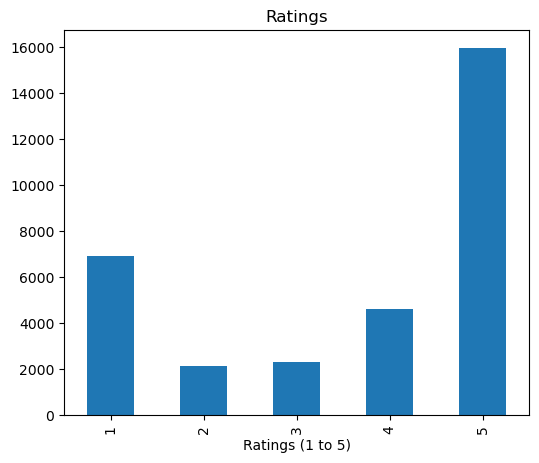

In [29]:
ax = dlf['overall'].value_counts().sort_index() \
    .plot(kind='bar',
          title='Ratings',
          figsize=(6,5))
ax.set_xlabel('Ratings (1 to 5)')
plt.show()

## VADER Sentiment Analysis

In [30]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [31]:
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

In [32]:
from tqdm.notebook import tqdm


res = []
for i, row in tqdm(dlf.iterrows(), total=len(dlf)):
    text = row['new_reviewtext']
    res.append(sia.polarity_scores(text))

  0%|          | 0/31871 [00:00<?, ?it/s]

In [33]:
dlf_copy=dlf

In [34]:
score=pd.DataFrame(res)
score

,neg,neu,pos,compound
0,0.223,0.563,0.214,-0.1280
1,0.037,0.792,0.171,0.9309
2,0.053,0.596,0.351,0.9987
3,0.061,0.621,0.318,0.9768
4,0.102,0.662,0.236,0.6866
...,...,...,...,...
31866,0.109,0.786,0.105,-0.0516
31867,0.000,0.645,0.355,0.5267
31868,0.069,0.554,0.377,0.8779
31869,0.116,0.884,0.000,-0.4404


In [35]:
df_merged = pd.concat([dlf_copy, score], ignore_index=False,axis=1)
df_merged

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,...,brand,main_cat,date,price,new_reviewtext,Sentiment,neg,neu,pos,compound
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...,Neutral,0.223,0.563,0.214,-0.1280
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...,Positive,0.037,0.792,0.171,0.9309
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...,Positive,0.053,0.596,0.351,0.9987
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...,Positive,0.061,0.621,0.318,0.9768
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...,Negative,0.102,0.662,0.236,0.6866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31866,1,14,False,2011-03-05,AD6UR7YTOVPSL,B000Z90B1E,jane,After reading the reviews I purchased this ite...,Very disappointed,1299283200,...,ideal.,Office Products,"November 16, 2007",$23.90,reading reviews purchased item daughters weddi...,Negative,0.109,0.786,0.105,-0.0516
31867,1,4,True,2014-05-11,AVNP2G47GMTJF,B000Z90B1E,Mary Helen Sotelo,Clumsy to use and does not stay in place when ...,Disappointed,1399766400,...,ideal.,Office Products,"November 16, 2007",$23.90,clumsy use stay place stamping would recommend...,Negative,0.000,0.645,0.355,0.5267
31868,5,6,True,2010-09-05,ATCA5VAH5VHQ1,B000Z8UNQ8,Amazon Customer,This product was just as described.\n\nI have ...,Great product,1283644800,...,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27,product described another sentrysafe safe diff...,Positive,0.069,0.554,0.377,0.8779
31869,1,2,True,2017-12-22,A2AP99H4C05BIO,B000Z8UNQ8,Sherri Marshall,The lock on the box doesn't work. The product...,Two Stars,1513900800,...,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27,lock box work product defective key thin could...,Negative,0.116,0.884,0.000,-0.4404


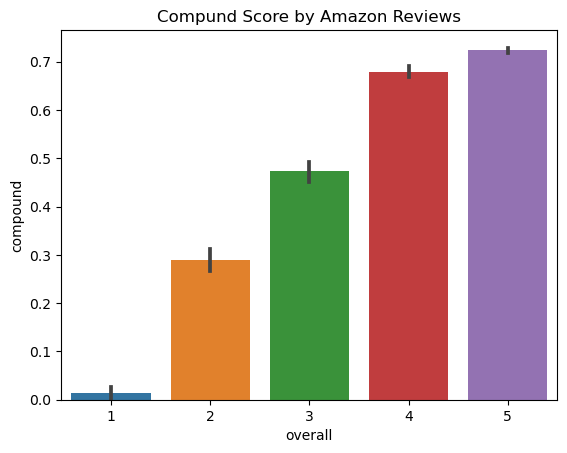

In [36]:
import seaborn as sns

ax = sns.barplot(data=df_merged, x='overall', y='compound')
ax.set_title('Compund Score by Amazon Reviews')
plt.show()

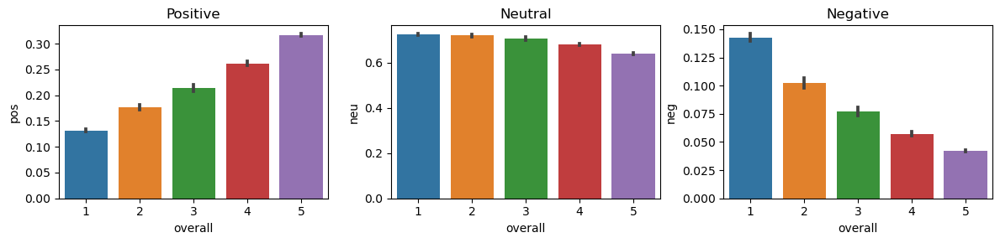

In [37]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=df_merged, x='overall', y='pos', ax=axs[0])
sns.barplot(data=df_merged, x='overall', y='neu', ax=axs[1])
sns.barplot(data=df_merged, x='overall', y='neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

# clustering

In [38]:
pos_reviews = df_merged[df_merged['Sentiment'] == 'Positive']
pos_text = pd.DataFrame(pos_reviews['new_reviewtext'])
print("The positive Text are \n",pos_text)


neg_reviews = df_merged[df_merged['Sentiment'] == 'Negative']
neg_text = pd.DataFrame(neg_reviews['new_reviewtext'])     
print("The Negative Text are \n",neg_text)



neutral_reviews = df_merged[df_merged['Sentiment'] == 'Neutral']
neutral_text = pd.DataFrame(neutral_reviews['new_reviewtext'])
print("The Neutral Text are \n",neutral_text)


The positive Text are 
                                           new_reviewtext
1      installment corduroy adventures lisa see time ...
2      researchers constantly find reading children v...
3      one day corduroy stuffed bear goes lisa owner ...
9      2 1 2 year old adores book fact make rule twic...
10     likeed book daughter loves corduroy character ...
...                                                  ...
31861  bought embosser daughter-in-law never gets rid...
31862  bought 6 gifts really appreciated unique good ...
31863  needed best price toner cartridges clinic amaz...
31865  nice clean impressions minimal effort arrived ...
31868  product described another sentrysafe safe diff...

[20525 rows x 1 columns]
The Negative Text are 
                                           new_reviewtext
4      anyone see something disturbing little friend ...
5      hate book love original courduroy sequel irrit...
6      wife well daughter loved original corduroy boo...
17     read re

In [39]:

def positive_reviews(df_merged,i):
    pos_reviews = df_merged[df_merged['Sentiment'] == str(i)]
    print(pos_reviews)
    global pos_text
    pos_text = pd.DataFrame(pos_reviews['new_reviewtext'])
    return pos_text

In [40]:
"""pip install wordcloud"""

'pip install wordcloud'

In [41]:
from wordcloud import WordCloud

In [42]:
def pos_wc(pos_text):
    wc = WordCloud(height=400, width=600, 
               min_font_size=4, min_word_length=3,background_color='black',
              normalize_plurals=True, include_numbers=False, repeat = False) 
    text = " ".join(x for x in pos_text['new_reviewtext'].astype(str))
    wc.generate(text)
    wc.to_file('positive_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()

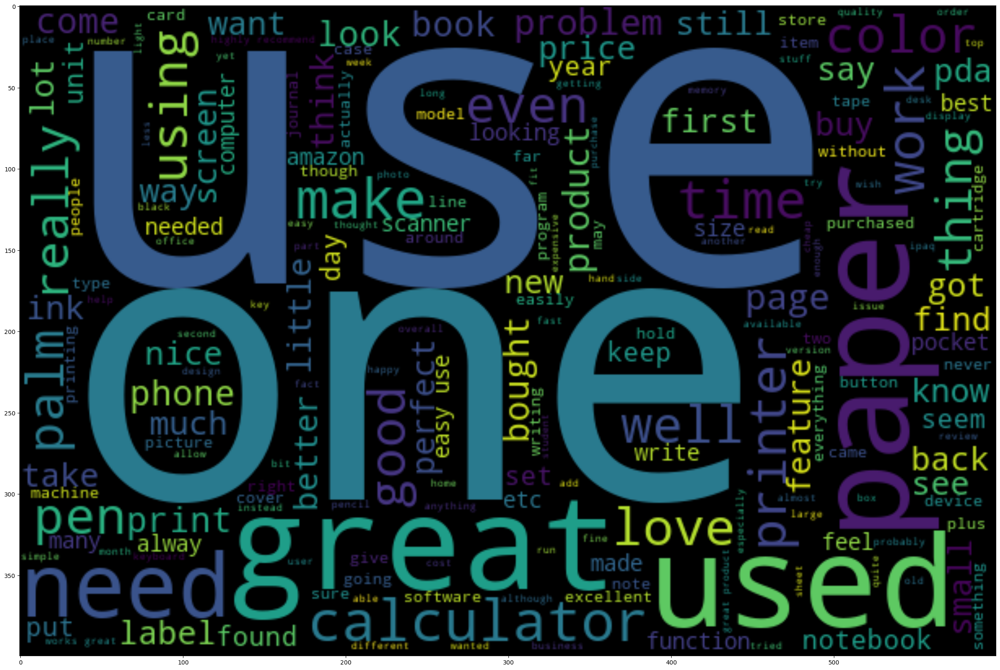

In [43]:
pos_wc(pos_text)

In [44]:
def neg_wc(neg_text):
    wc = WordCloud(height=400, width=600, 
               min_font_size=4, min_word_length=3,background_color='black',
              normalize_plurals=True, include_numbers=False, repeat = False)
    text = " ".join(x for x in neg_text['new_reviewtext'].astype(str))
    wc.generate(text)
    wc.to_file('negative_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()

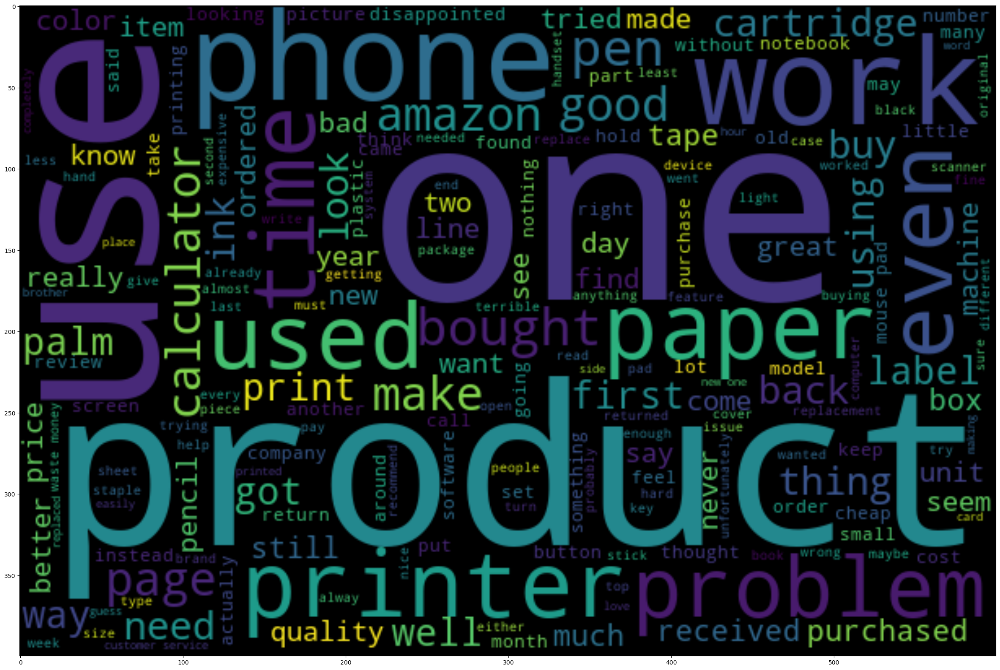

In [45]:
neg_wc(neg_text)

In [46]:
def neutral_wc(neu_text):
    wc = WordCloud(height=400, width=600, 
               min_font_size=4, min_word_length=3, background_color='black',
              normalize_plurals=True, include_numbers=False, repeat = False)
    text = " ".join(x for x in neu_text['new_reviewtext'].astype(str))
    wc.generate(text)
    wc.to_file('neutral_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()

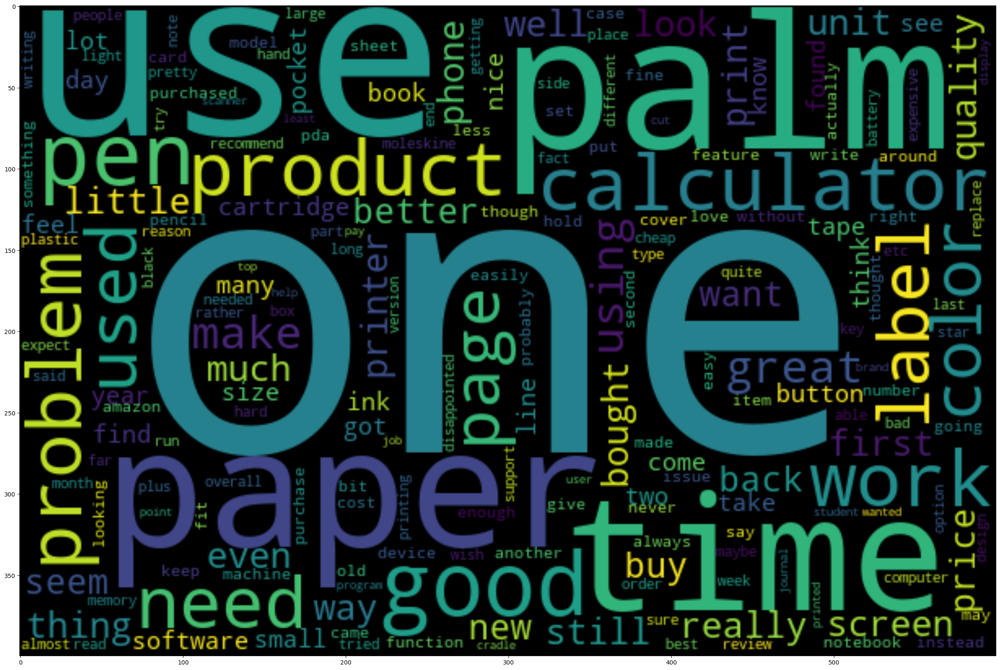

In [47]:
neutral_wc(neutral_text)

In [48]:
review_pos = df_merged[df_merged['Sentiment'] == 'Positive']['new_reviewtext']
     

review_neu = df_merged[df_merged['Sentiment'] == 'Neutral']['new_reviewtext']
     

review_neg = df_merged[df_merged['Sentiment'] == 'Negative']['new_reviewtext']

In [49]:
## custom function for ngram generation ##
import plotly.graph_objs as go
def generate_ngrams(text, n_gram=1):
    token = [token for token in str(text).lower().split(" ") if token != "" if token not in stopwords]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]


## custom function for horizontal bar chart ##
def horizontal_bar_chart(df_merged, color):
    trace = go.Bar(
        y=df_merged["word"].values[::-1],
        x=df_merged["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

In [50]:
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))
from plotly.offline import iplot

In [51]:
## Get the bar chart from positive reviews
from collections import defaultdict
freq_dict = defaultdict(int)
for sent in review_pos:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in review_neu:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'blue')

## Get the bar chart from negative reviews
freq_dict = defaultdict(int)
for sent in review_neg:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]

trace2 = horizontal_bar_chart(fd_sorted.head(25), 'green')

# Creating two subplots
from plotly import tools
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

C:\Users\DELL\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [52]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

In [53]:
scaling=StandardScaler()

In [54]:
X=df_merged[["new_reviewtext","Sentiment"]]
X

,new_reviewtext,Sentiment
0,thought book entertaining cute introduction go...,Neutral
1,installment corduroy adventures lisa see time ...,Positive
2,researchers constantly find reading children v...,Positive
3,one day corduroy stuffed bear goes lisa owner ...,Positive
4,anyone see something disturbing little friend ...,Negative
...,...,...
31866,reading reviews purchased item daughters weddi...,Negative
31867,clumsy use stay place stamping would recommend...,Negative
31868,product described another sentrysafe safe diff...,Positive
31869,lock box work product defective key thin could...,Negative


In [55]:
df_merged.head()

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,...,brand,main_cat,date,price,new_reviewtext,Sentiment,neg,neu,pos,compound
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...,Neutral,0.223,0.563,0.214,-0.1280
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...,Positive,0.037,0.792,0.171,0.9309
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...,Positive,0.053,0.596,0.351,0.9987
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...,Positive,0.061,0.621,0.318,0.9768
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,...,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...,Negative,0.102,0.662,0.236,0.6866


In [56]:
lc=LabelEncoder()
X=df_merged.copy()

In [57]:
X=X.iloc[:,:-5]
X

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price,new_reviewtext
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,"['Office Products', 'Office & School Supplies'...",A Pocket for Corduroy,Ingram Book & Distributor,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31866,1,14,False,2011-03-05,AD6UR7YTOVPSL,B000Z90B1E,jane,After reading the reviews I purchased this ite...,Very disappointed,1299283200,"['Office Products', 'Office & School Supplies'...",Return Address Name Embosser/Seal,ideal.,Office Products,"November 16, 2007",$23.90,reading reviews purchased item daughters weddi...
31867,1,4,True,2014-05-11,AVNP2G47GMTJF,B000Z90B1E,Mary Helen Sotelo,Clumsy to use and does not stay in place when ...,Disappointed,1399766400,"['Office Products', 'Office & School Supplies'...",Return Address Name Embosser/Seal,ideal.,Office Products,"November 16, 2007",$23.90,clumsy use stay place stamping would recommend...
31868,5,6,True,2010-09-05,ATCA5VAH5VHQ1,B000Z8UNQ8,Amazon Customer,This product was just as described.\n\nI have ...,Great product,1283644800,"['Office Products', 'Office & School Supplies'...",SentrySafe 1170 Fireproof Box with Key Lock 0....,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27,product described another sentrysafe safe diff...
31869,1,2,True,2017-12-22,A2AP99H4C05BIO,B000Z8UNQ8,Sherri Marshall,The lock on the box doesn't work. The product...,Two Stars,1513900800,"['Office Products', 'Office & School Supplies'...",SentrySafe 1170 Fireproof Box with Key Lock 0....,SentrySafe,Tools & Home Improvement,"November 26, 2007",$35.27,lock box work product defective key thin could...


In [58]:
X=X.apply(lc.fit_transform)
X

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,category,title,brand,main_cat,date,price,new_reviewtext
0,2,4,0,1860,10148,0,1720,8287,2414,1860,68,101,273,16,956,1,17918
1,4,10,0,367,14064,0,9635,10217,5939,367,68,101,273,16,956,1,8285
2,4,63,0,216,2915,0,3925,13110,7622,216,68,101,273,16,956,1,15951
3,4,0,0,4834,8071,0,9324,12316,8258,4834,68,101,273,16,956,1,11848
4,0,3,0,4058,15640,0,15707,1648,1759,4058,68,101,273,16,956,1,761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31866,0,12,0,3280,16749,3557,15859,442,9433,3280,181,2742,660,16,780,820,15247
31867,0,2,1,4427,19521,3557,9453,1450,2003,4427,181,2742,660,16,780,820,3386
31868,4,4,1,3104,19167,3556,666,17742,4134,3104,130,2957,520,19,818,1137,14125
31869,0,0,1,5720,6995,3556,12872,14346,9219,5720,130,2957,520,19,818,1137,9290


In [59]:
X=scaling.fit_transform(X)
X

array([[-0.39434665, -0.16479908, -1.40090667, ...,  1.32600263,
        -1.69019387,  1.26047528],
       [ 0.83098456,  0.18061138, -1.40090667, ...,  1.32600263,
        -1.69019387, -0.34679249],
       [ 0.83098456,  3.23173705, -1.40090667, ...,  1.32600263,
        -1.69019387,  0.93228098],
       ...,
       [ 0.83098456, -0.16479908,  0.71382343, ...,  0.88510092,
         0.19905999,  0.62761255],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999, -0.17910806],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999,  0.65898038]])

## PCA to find the best 2 features from the dataframe

In [60]:
from sklearn.decomposition import PCA

In [61]:
pca_df=PCA(n_components=2)

In [62]:
new=pca_df.fit_transform(X)
new

array([[ 1.01130918, -1.78701111],
       [ 1.94265697, -1.83451463],
       [ 2.51756727, -1.87983707],
       ...,
       [-1.16944985,  1.59357413],
       [-3.01626992,  1.57527105],
       [-2.90092329,  1.63448542]])

In [63]:
X

array([[-0.39434665, -0.16479908, -1.40090667, ...,  1.32600263,
        -1.69019387,  1.26047528],
       [ 0.83098456,  0.18061138, -1.40090667, ...,  1.32600263,
        -1.69019387, -0.34679249],
       [ 0.83098456,  3.23173705, -1.40090667, ...,  1.32600263,
        -1.69019387,  0.93228098],
       ...,
       [ 0.83098456, -0.16479908,  0.71382343, ...,  0.88510092,
         0.19905999,  0.62761255],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999, -0.17910806],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999,  0.65898038]])

## K Means Clustering Algorithm

In [64]:
from sklearn.cluster import KMeans

# Define the number of clusters
n_clusters = 3

# Apply KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(new)

# Add the cluster labels to the original dataframe
df_merged['cluster'] = kmeans.labels_

# Print the number of data points in each cluster
print(df_merged['cluster'].value_counts())

0    11979
2    10860
1     9032
Name: cluster, dtype: int64


In [65]:
c_centre=kmeans.cluster_centers_
c_centre

array([[-0.94295162, -1.21119182],
       [ 2.6101972 ,  0.03596415],
       [-1.12755614,  1.30862146]])

In [66]:
k_label=kmeans.labels_
k_label

array([0, 1, 1, ..., 2, 2, 2])

In [67]:
y_pr=kmeans.predict(new)
y_pr

array([0, 1, 1, ..., 2, 2, 2])

In [68]:
X


array([[-0.39434665, -0.16479908, -1.40090667, ...,  1.32600263,
        -1.69019387,  1.26047528],
       [ 0.83098456,  0.18061138, -1.40090667, ...,  1.32600263,
        -1.69019387, -0.34679249],
       [ 0.83098456,  3.23173705, -1.40090667, ...,  1.32600263,
        -1.69019387,  0.93228098],
       ...,
       [ 0.83098456, -0.16479908,  0.71382343, ...,  0.88510092,
         0.19905999,  0.62761255],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999, -0.17910806],
       [-1.61967787, -0.39507271,  0.71382343, ...,  0.88510092,
         0.19905999,  0.65898038]])

In [69]:
new

array([[ 1.01130918, -1.78701111],
       [ 1.94265697, -1.83451463],
       [ 2.51756727, -1.87983707],
       ...,
       [-1.16944985,  1.59357413],
       [-3.01626992,  1.57527105],
       [-2.90092329,  1.63448542]])

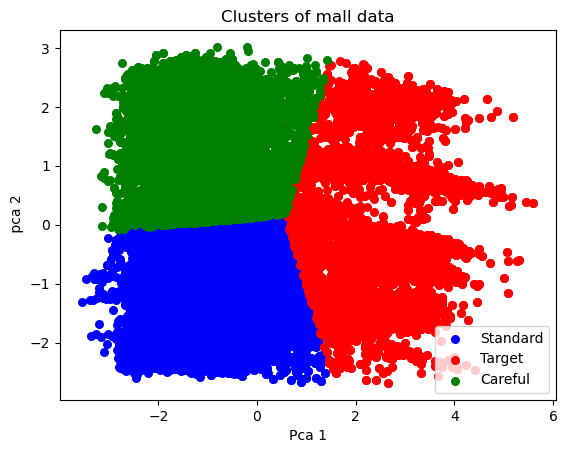

In [70]:
plt.scatter(new[y_pr==0,0],new[y_pr==0,1],s=30,c='blue',label='Standard')
plt.scatter(new[y_pr==1,0],new[y_pr==1,1],s=30,c='red',label='Target')
plt.scatter(new[y_pr==2,0],new[y_pr==2,1],s=30,c='green',label='Careful')

plt.title('Clusters of mall data')
plt.xlabel('Pca 1')
plt.ylabel(' pca 2')
plt.legend()
plt.show()

# Time Series Analysis

In [71]:
import warnings
warnings.filterwarnings('ignore')

In [72]:
df_merged.head()

,overall,vote,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,...,main_cat,date,price,new_reviewtext,Sentiment,neg,neu,pos,compound,cluster
0,3,6,False,2006-11-03,A2WJLOXXIB7NF3,0140503528,Brandi D&#039;Angelo,"I thought the book was entertaining and cute, ...",Entertaining-but maybe not for young toddlers,1162512000,...,Office Products,"September 14, 2006",$0.95,thought book entertaining cute introduction go...,Neutral,0.223,0.563,0.214,-0.1280,0
1,5,12,False,2001-01-24,A3N0HBW8IP8CZQ,0140503528,Melissa P. Cooper,In this installment of Corduroy's adventures w...,More adventures with Lisa's very own bear. . .,980294400,...,Office Products,"September 14, 2006",$0.95,installment corduroy adventures lisa see time ...,Positive,0.037,0.792,0.171,0.9309,1
2,5,65,False,2000-07-30,A1K1JW1C5CUSUZ,0140503528,Donald Mitchell,Researchers constantly find that reading to ch...,Read to Your Child to Create Bonding and Intel...,964915200,...,Office Products,"September 14, 2006",$0.95,researchers constantly find reading children v...,Positive,0.053,0.596,0.351,0.9987,1
3,5,2,False,2015-06-22,A2I6MHMAZZDCRX,0140503528,Mark Baker - Carstairs Considers,"One day, Corduroy, a stuffed bear, goes with L...",Sweet and Fun Sequel,1434931200,...,Office Products,"September 14, 2006",$0.95,one day corduroy stuffed bear goes lisa owner ...,Positive,0.061,0.621,0.318,0.9768,0
4,1,5,False,2013-05-07,A5H2P1G7XOWOP,0140503528,grandmother of three,Did not anyone see something disturbing about ...,Creepy and scary.,1367884800,...,Office Products,"September 14, 2006",$0.95,anyone see something disturbing little friend ...,Negative,0.102,0.662,0.236,0.6866,0


In [73]:
rating_time_df=df_merged[['reviewTime','overall']]
rating_time_df.head()

,reviewTime,overall
0,2006-11-03,3
1,2001-01-24,5
2,2000-07-30,5
3,2015-06-22,5
4,2013-05-07,1


In [74]:
# Convert reviewTime to datetime format and set it as the index
rating_time_df['reviewTime'] = pd.to_datetime(rating_time_df['reviewTime'], format='%d-%m-%Y')
rating_time_df.set_index('reviewTime', inplace=True)

In [75]:
rating_time_df=rating_time_df[['overall']]
rating_time_df=rating_time_df.sort_values(by='reviewTime')

In [76]:
rating_time_df

,overall
reviewTime,
1999-05-08,5
1999-05-08,5
1999-07-06,5
1999-07-06,5
1999-07-17,4
...,...
2018-04-04,5
2018-04-05,1
2018-04-11,3


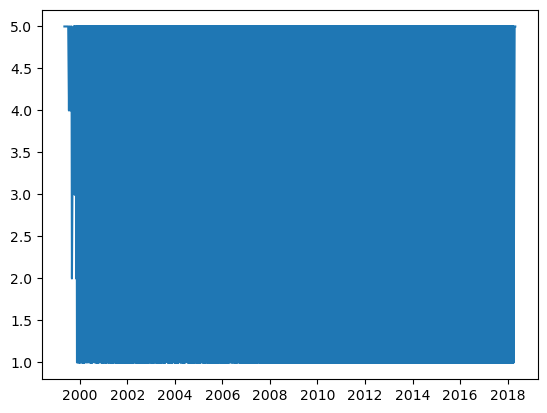

In [77]:
plt.plot(rating_time_df)

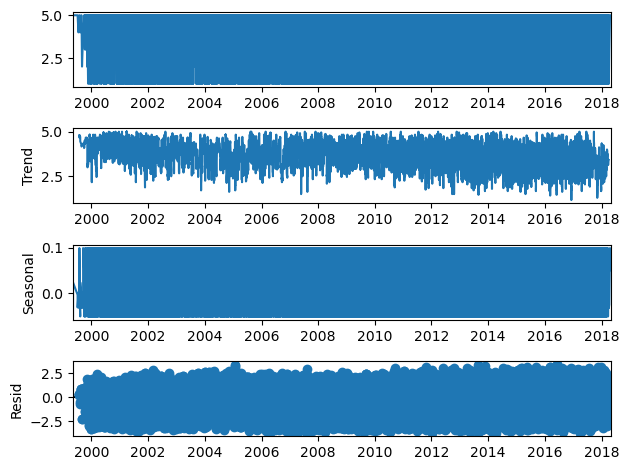

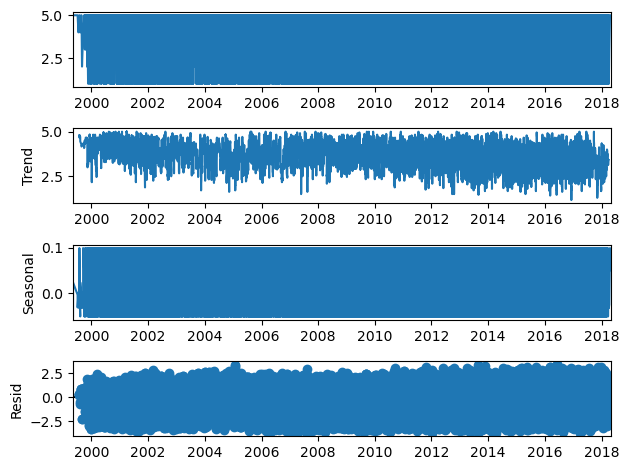

In [78]:
from statsmodels.tsa.seasonal import seasonal_decompose

seasonal_decompose(rating_time_df,period=12).plot()

In [79]:

# Resample the data to monthly frequency
monthly_data = rating_time_df.resample('M').mean()
monthly_data

,overall
reviewTime,
1999-05-31,5.000000
1999-06-30,NaN
1999-07-31,4.750000
1999-08-31,4.750000
1999-09-30,4.000000
...,...
2017-12-31,2.871429
2018-01-31,3.387500
2018-02-28,2.982759


In [80]:
monthly_data=monthly_data.drop('1999-06-30')


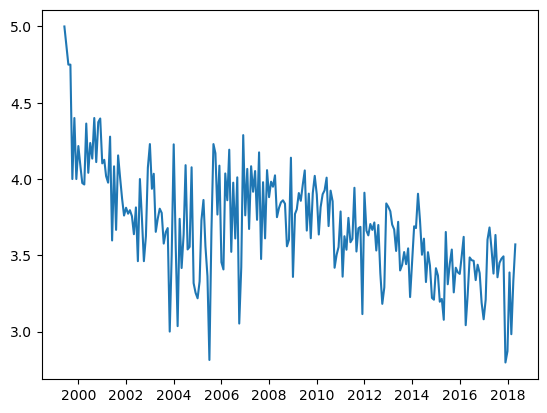

In [81]:
plt.plot(monthly_data)

In [82]:
monthly_data.isnull().sum()

overall    0
dtype: int64

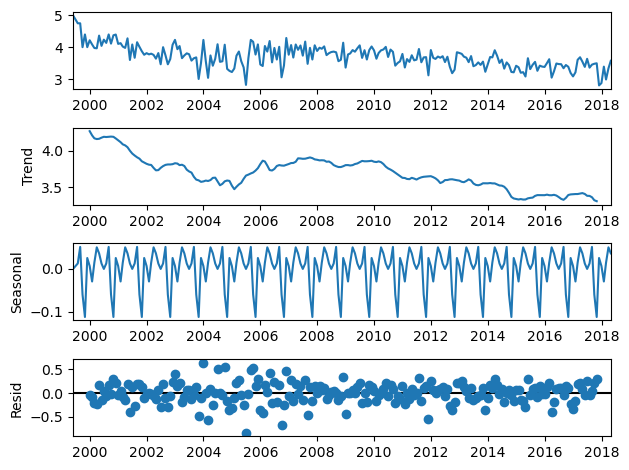

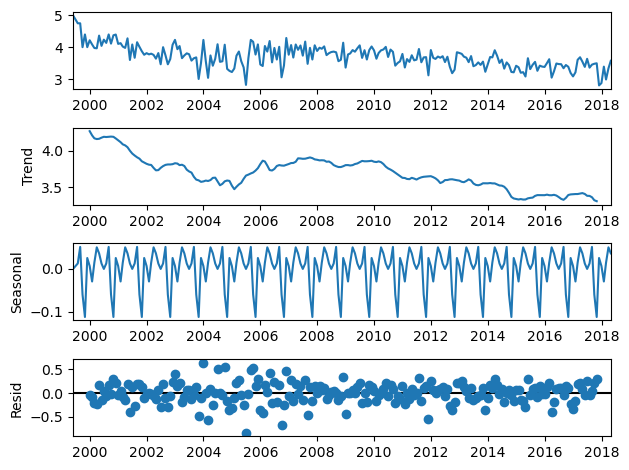

In [83]:
seasonal_decompose(monthly_data,period=12).plot()

In [84]:
from statsmodels.tsa.stattools import adfuller

def checkstationary(monthly_data):
    pvalue=adfuller(monthly_data)[1]
    print(pvalue)
    if pvalue<0.05:
        msg='pvalue={}. Data is stationary.proceed to model building '.format(pvalue)
    else:
        msg='pvalue={}. Data is not stationary.make the data statinoary and proceed to model building '.format(pvalue)
        
    return msg

In [85]:
print(checkstationary(monthly_data))

0.056622160851351924
pvalue=0.056622160851351924. Data is not stationary.make the data statinoary and proceed to model building 


In [87]:
import numpy as np
from statsmodels.tsa.api import ExponentialSmoothing

# Convert the data to a numpy array
#data_array = np.asarray(monthly_data.overall)

# Fit the model with the converted data
alpha = 0.37
beta = 0.5
gamma = 0.15
model3 = ExponentialSmoothing(monthly_data, trend='add', seasonal='add', seasonal_periods=12).fit(smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma)


C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [88]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

def checkstationary(monthly_data):
    pvalue=adfuller(monthly_data)[1]
    print(pvalue)
    if pvalue<0.05:
        msg='pvalue={}. Data is stationary.proceed to model building '.format(pvalue)
    else:
        msg='pvalue={}. Data is not stationary.make the data statinoary and proceed to model building '.format(pvalue)
        
    return msg

In [89]:
print(checkstationary(monthly_data))

0.056622160851351924
pvalue=0.056622160851351924. Data is not stationary.make the data statinoary and proceed to model building 


In [90]:
# if data is not the stationary ,make the data stationary bewfore building

diff_overall=monthly_data-monthly_data.shift()   #default shift is =1
diff_overall

,overall
reviewTime,
1999-05-31,NaN
1999-07-31,-0.250000
1999-08-31,0.000000
1999-09-30,-0.750000
1999-10-31,0.400000
...,...
2017-12-31,0.073960
2018-01-31,0.516071
2018-02-28,-0.404741


In [91]:
# dropping the nulls from the differenced data

diff_overall.dropna(inplace=True)

In [92]:
diff_overall

,overall
reviewTime,
1999-07-31,-0.250000
1999-08-31,0.000000
1999-09-30,-0.750000
1999-10-31,0.400000
1999-11-30,-0.400000
...,...
2017-12-31,0.073960
2018-01-31,0.516071
2018-02-28,-0.404741


In [93]:
# checking the data is stationary or not
checkstationary(diff_overall)

5.158270286179813e-10


'pvalue=5.158270286179813e-10. Data is stationary.proceed to model building '

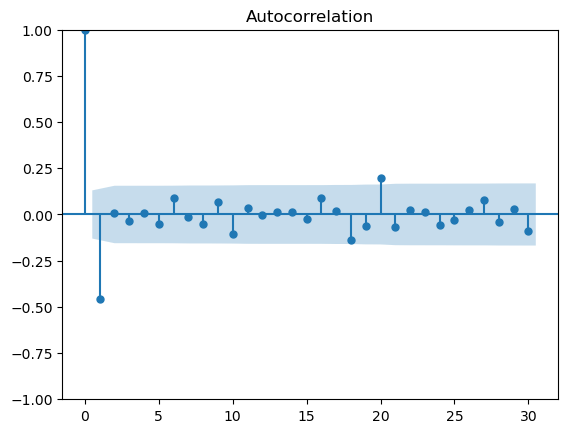

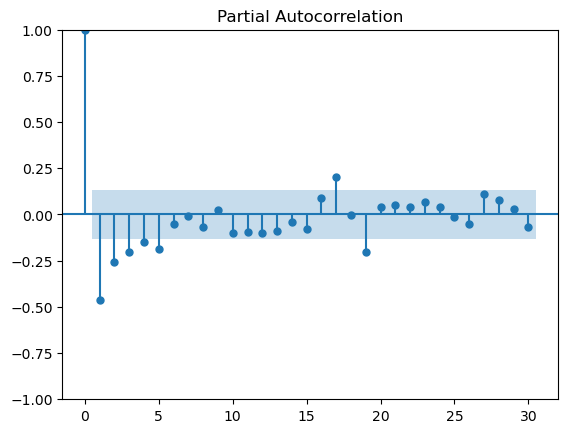

In [94]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

plot_acf(diff_overall,lags=30);
plot_pacf(diff_overall,lags=30);

q=2
p=7

In [95]:
import numpy as np
from statsmodels.tsa.arima.model import ARIMA

for p in range(1,8):
    for q in range(1,3):
        model1=ARIMA(diff_overall,order=(p,0,q))
        r1=model1.fit()
        print(r1.summary())


C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 -14.059
Date:                Mon, 27 Mar 2023   AIC                             36.119
Time:                        17:03:01   BIC                             49.801
Sample:                    07-31-1999   HQIC                            41.640
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.002     -2.006      0.045      -0.010      -0.000
ar.L1          0.1035      0.075      1.371      0.170      -0.044       0.251
ma.L1         -0.8770      0.037    -23.952      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(1, 0, 2)   Log Likelihood                 -14.004
Date:                Mon, 27 Mar 2023   AIC                             38.008
Time:                        17:03:02   BIC                             55.110
Sample:                    07-31-1999   HQIC                            44.910
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.003     -1.962      0.050      -0.010   -4.09e-06
ar.L1          0.2692      0.592      0.455      0.649      -0.891       1.429
ma.L1         -1.0425      0.603     -1.728      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 -13.948
Date:                Mon, 27 Mar 2023   AIC                             37.896
Time:                        17:03:03   BIC                             54.999
Sample:                    07-31-1999   HQIC                            44.798
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.002     -1.967      0.049      -0.010   -1.68e-05
ar.L1          0.1086      0.076      1.423      0.155      -0.041       0.258
ar.L2          0.0352      0.061      0.572      0.5

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so i

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 -13.776
Date:                Mon, 27 Mar 2023   AIC                             39.551
Time:                        17:03:04   BIC                             60.074
Sample:                    07-31-1999   HQIC                            47.833
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.002     -1.953      0.051      -0.010    1.63e-05
ar.L1         -0.5343      0.896     -0.596      0.551      -2.291       1.222
ar.L2          0.1126      0.087      1.291      0.1

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(3, 0, 2)   Log Likelihood                 -19.358
Date:                Mon, 27 Mar 2023   AIC                             52.715
Time:                        17:03:05   BIC                             76.659
Sample:                    07-31-1999   HQIC                            62.378
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0034      0.001     -4.547      0.000      -0.005      -0.002
ar.L1         -0.2327      1.993     -0.117      0.907      -4.138       3.673
ar.L2          0.3081      0.535      0.576      0.5

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(4, 0, 1)   Log Likelihood                 -13.697
Date:                Mon, 27 Mar 2023   AIC                             41.393
Time:                        17:03:06   BIC                             65.337
Sample:                    07-31-1999   HQIC                            51.056
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.003     -1.936      0.053      -0.010    6.02e-05
ar.L1          0.0917      0.089      1.028      0.304      -0.083       0.266
ar.L2          0.0252      0.064      0.394      0.6

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so i

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(4, 0, 2)   Log Likelihood                 -13.754
Date:                Mon, 27 Mar 2023   AIC                             43.508
Time:                        17:03:08   BIC                             70.872
Sample:                    07-31-1999   HQIC                            54.551
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.003     -1.943      0.052      -0.010    4.22e-05
ar.L1         -0.3240     13.925     -0.023      0.981     -27.616      26.968
ar.L2          0.0729      1.359      0.054      0.9

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so i

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(5, 0, 2)   Log Likelihood                 -13.304
Date:                Mon, 27 Mar 2023   AIC                             44.608
Time:                        17:03:11   BIC                             75.393
Sample:                    07-31-1999   HQIC                            57.031
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0050      0.003     -1.906      0.057      -0.010       0.000
ar.L1         -0.4060      0.967     -0.420      0.675      -2.301       1.489
ar.L2          0.0501      0.143      0.349      0.7

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so i

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(6, 0, 2)   Log Likelihood                 -12.996
Date:                Mon, 27 Mar 2023   AIC                             45.992
Time:                        17:03:13   BIC                             80.197
Sample:                    07-31-1999   HQIC                            59.796
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0049      0.003     -1.895      0.058      -0.010       0.000
ar.L1         -0.1271      1.248     -0.102      0.919      -2.572       2.318
ar.L2          0.0411      0.120      0.344      0.7

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  226
Model:                 ARIMA(7, 0, 1)   Log Likelihood                 -12.846
Date:                Mon, 27 Mar 2023   AIC                             45.693
Time:                        17:03:15   BIC                             79.898
Sample:                    07-31-1999   HQIC                            59.497
                         - 04-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0050      0.003     -1.940      0.052      -0.010    5.02e-05
ar.L1          0.0982      0.107      0.914      0.361      -0.112       0.309
ar.L2          0.0270      0.093      0.291      0.7

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model with (1,0,1) is having the lowest AIC score

In [96]:
train_data, test_data = diff_overall[0:int(len(diff_overall)*0.8)], diff_overall[int(len(diff_overall)*0.8):]

In [97]:
test_data.shape

(46, 1)

In [98]:
train_data.shape

(180, 1)

In [99]:
#  Build the SARIMA model.
from statsmodels.tsa.statespace.sarimax import SARIMAX
p=1;d=1;q=1;
P=1;D=1;Q=0;
sarima_model = SARIMAX(train_data, order=(p,d,q), seasonal_order=(P,D,Q,12))
sarima_model_fit = sarima_model.fit()

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



In [101]:
# Step 1: Make predictions on the test data
predictions = sarima_model_fit.predict(start = len(train_data), end = len(train_data) + len(test_data)-1, dynamic=False)

# Step 2: Compare the predicted values with the actual values
actual = test_data['overall']
predicted = predictions

# Step 3: Calculate MSE and RMSE
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(actual, predicted)
rmse = sqrt(mse)

print("MSE:", mse)
print("RMSE:", rmse)


MSE: 0.06778456368024308
RMSE: 0.26035468822405156


In [102]:
compare=pd.DataFrame({"Actual":actual,"Predicted":predicted})
compare

,Actual,Predicted
2014-07-31,-0.284305,-0.066402
2014-08-31,0.195660,-0.006039
2014-09-30,-0.086300,-0.158171
2014-10-31,-0.213558,0.125987
2014-11-30,-0.011633,0.046493
2014-12-31,0.206367,0.130745
2015-01-31,-0.047976,0.127896
2015-02-28,-0.171602,-0.037590
2015-03-31,0.018263,0.121682
2015-04-30,-0.136660,-0.152919


In [110]:
# Set the number of time periods to forecast
n_periods = 12

# Make the forecast
forecast = sarima_model_fit.forecast(len(actual)+n_periods)

# Print the forecasted values
forecast.tail()

2018-12-31    0.174916
2019-01-31    0.175211
2019-02-28   -0.013964
2019-03-31    0.167633
2019-04-30   -0.141925
Freq: M, Name: predicted_mean, dtype: float64

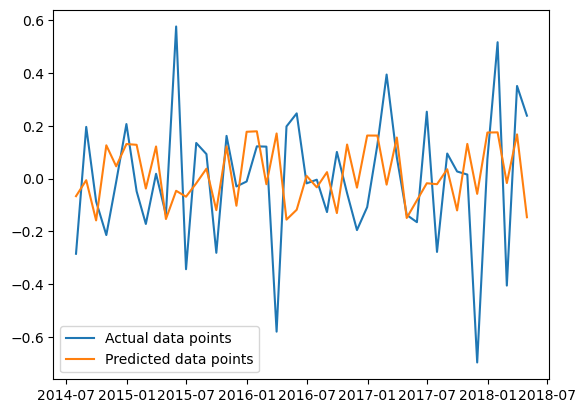

In [109]:
plt.plot(actual,label='Actual data points')
plt.plot(predicted,label='Predicted data points')

plt.legend()
plt.show()

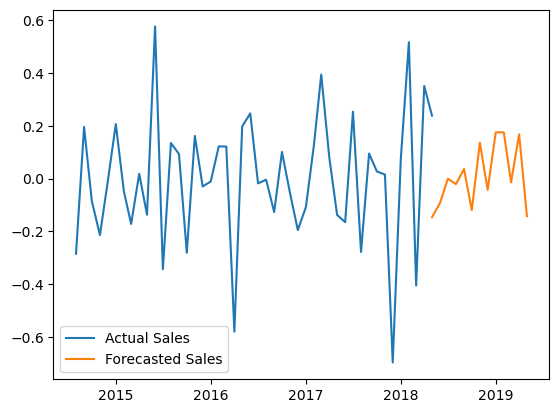

In [108]:
n_forecast = 12
start_date = '2018-04-30'

plt.plot(test_data, label='Actual Sales')
plt.plot(forecast['2018-04-30':], label='Forecasted Sales')
plt.legend()
plt.show()